# **Image Recoloring with conditional GANs**
**Shabnaz Ghaffari**

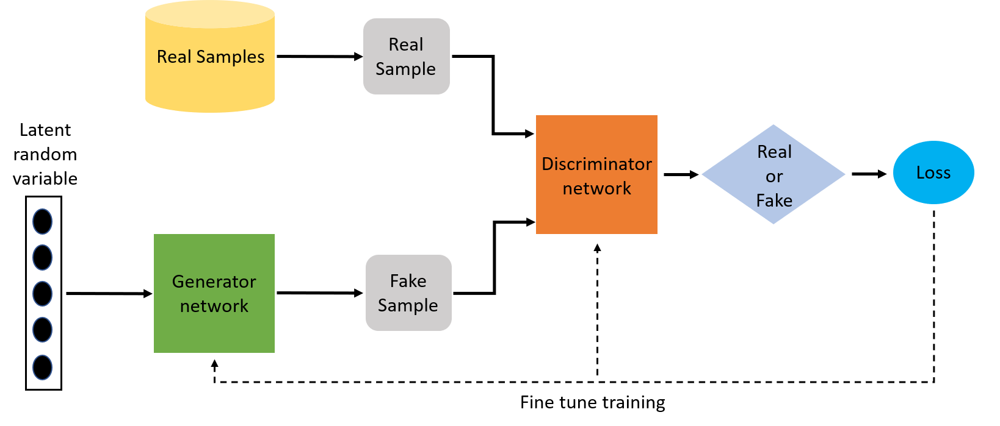



*   The GAN architecture consists of two neural networks: a generator and a discriminator. The generator network takes a random noise vector as input and generates a fake image. The discriminator network takes either a real or a fake image as input and tries to classify it as either real or fake.

*   During training, the generator and discriminator are trained in an adversarial manner, meaning that the generator tries to generate better and better fake images that can fool the discriminator, while the discriminator tries to better distinguish between real and fake images. The objective of the generator is to generate images that are indistinguishable from real images, while the objective of the discriminator is to correctly classify real and fake images.


##Main steps:


### 1.   choose dataset
  - I choose coco5000-2017 as a dataset for this project

### 2.   UNET Autoencoder
  - modified version of the UNet architecture

### 3.   GAN implementation
  - Implementing a Generative Adversarial Network (GAN) involves creating and training two neural networks
  
### 4.   improve by CWGAN
  - improve tne GAN model by Conditional Wasserstein Generative Adversarial Network (CWGAN)
  
### 5.   compare losses
  -  compare losses of GAN and CWGAN

# Import libraries

In [ ]:
import os
from pathlib import Path
import glob
import time
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import PIL
from PIL import Image
from skimage import io, color, transform
from skimage.color import rgb2lab, lab2rgb
import cv2
import gc

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [ ]:
from torch import nn, optim
from torchvision.models.resnet import resnet18
from torchvision.models.vgg import vgg19
from torchsummary import summary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
! pip install pytorch_lightning

In [ ]:
import pytorch_lightning as pl

# Load dataset

In [ ]:
# Download Data

# ! pip install kaggle
# ! mkdir ~/.kaggle
# ! cp /kaggle.json ~/.kaggle/
# ! chmod 600 ~/.kaggle/kaggle.json
# ! kaggle datasets download awsaf49/coco-2017-dataset/test2017 --force
# ! unzip -o -q /content/coco-2017-dataset.zip

In [ ]:
# Load Data from Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! unzip -o -q /content/drive/MyDrive/coco5000.zip

In [ ]:
path = '/content/content/coco2017/val2017'
paths = np.array(glob.glob(path + "/*.jpg"))

 check that whether the dataset has duplicate images:

In [ ]:
image_dir = path
image_paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith('.jpg')]

# Create a set of all image paths
image_set = set(image_paths)  #set has no duplicates

# Check if there are any duplicate images
if len(image_set) != len(image_paths):
    print('There are duplicate images in the dataset.')
else:
    print('There are no duplicate images in the dataset.')

There are no duplicate images in the dataset.


## Spliting data
split data in to 3 parts: validation, test, train

In [ ]:
# Train test split

train_size = 1000
val_size = 1000
test_size = 10 # only for showing how the final model works

np.random.seed(42)
random_idxs = np.random.permutation(5000)
train_idxs = random_idxs[:train_size] # choosing the first 3000 as training set
val_idxs = random_idxs[train_size:train_size+val_size] # choosing 1000 as validation set
test_idxs = random_idxs[train_size+val_size:train_size+val_size+test_size]
train_paths = paths[train_idxs]
val_paths = paths[val_idxs]
test_paths = paths[test_idxs]


Class that deals with the Data Loading and preprocessing steps such as image resizing, data augmentation (horizontal flip)
    and conversion of RGB image to LAB color space with standardization.

In [ ]:
class ImageDataset(Dataset):

    def __init__(self,paths,train = True):
        self.image_size_1 = 224
        self.image_size_2 = 224

        if train == True:
            self.transforms = transforms.Compose([transforms.Resize((self.image_size_1,self.image_size_2)),
                                                 transforms.RandomHorizontalFlip()]) # Basic Data Augmentation
        elif train == False:
            self.transforms = transforms.Compose([transforms.Resize((self.image_size_1,self.image_size_2))])

        self.train = train
        self.paths = paths

    def __len__(self):
        return len(self.paths)

    def __getitem__(self,idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        lab = rgb2lab(img).astype("float32")
        lab = transforms.ToTensor()(lab)

        L = lab[[0],...]/50. - 1. # Standardizing L space
        ab = lab[[1,2],...]/128. # Standardizing ab space

        return ab, L

In [ ]:
batch_size = 16
# batch_size = 1
# train dataset
train_data = ImageDataset(paths = train_paths, train=True)
# validation dataset
valid_data = ImageDataset(paths = val_paths, train=False)
# test dataset
test_data = ImageDataset(paths = test_paths, train=False)

# train data loader
train_loader = DataLoader(train_data, batch_size=batch_size,shuffle=True,pin_memory = True)
# validation data loader
valid_loader = DataLoader(valid_data, batch_size=batch_size,shuffle=False,pin_memory = True)
# test data loader
test_loader = DataLoader(test_data, batch_size=batch_size,shuffle=False,pin_memory = True)

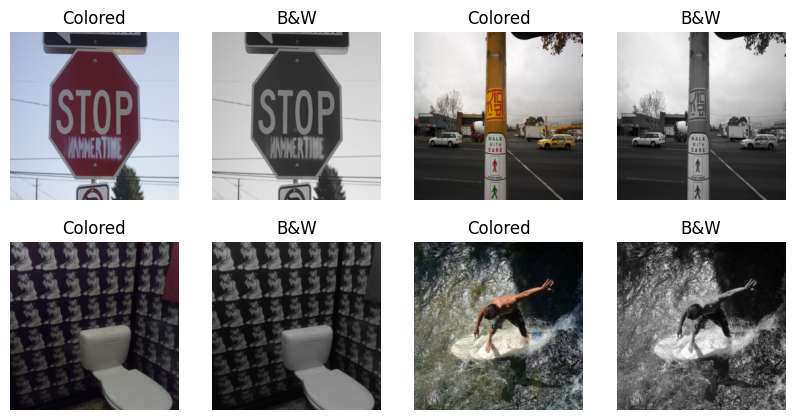

In [ ]:
trans = transforms.Compose([transforms.Resize((256,256))])

plt.figure(figsize=(10,5))
for i in range(1,8,2):
    plt.subplot(2,4,i)
    img = Image.open(paths[i]).convert("RGB")
    img = trans(img)
    img = np.array(img).astype('uint8')
    plt.title('Colored')
    plt.imshow(img)
    plt.axis("off")

    plt.subplot(2,4,i+1)
    img2 = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    plt.title('B&W')
    plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
    plt.axis("off")

## Example of LAB to RGB

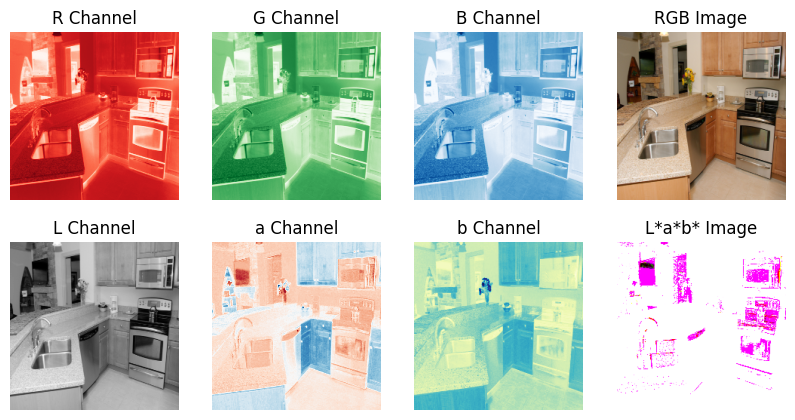

In [ ]:
img = io.imread(paths[0])
rgb_img = transform.resize(img, (224, 224))
lab_img = transform.resize(color.rgb2lab(img), (224, 224))

fig, axs = plt.subplots(2, 4, figsize=(10, 5))
axs[0][0].imshow(rgb_img[:, :, 0], cmap='Reds')
axs[0][0].set_title('R Channel')
axs[0][1].imshow(rgb_img[:, :, 1], cmap='Greens')
axs[0][1].set_title('G Channel')
axs[0][2].imshow(rgb_img[:, :, 2], cmap='Blues')
axs[0][2].set_title('B Channel')
axs[0][3].imshow(rgb_img)
axs[0][3].set_title('RGB Image')

axs[1][0].imshow(lab_img[:, :, 0], cmap='gray')
axs[1][0].set_title('L Channel')
axs[1][1].imshow(lab_img[:, :, 1], cmap='RdBu')
axs[1][1].set_title('a Channel')
axs[1][2].imshow(lab_img[:, :, 2], cmap='YlGnBu')
axs[1][2].set_title('b Channel')
axs[1][3].imshow(lab_img)
axs[1][3].set_title('L*a*b* Image')

for ax in axs.flat:
    ax.set_axis_off()

plt.show()

In [ ]:
np.shape(img)

(427, 640, 3)

# **GAN model**

## Generator(UNET)

A GAN consists of two networks that train together:


*   Generator — Given a vector of random values as input, this network generates data with the same structure as the training data.

*   Discriminator — Given batches of data containing observations from both the training data, and generated data from the generator, this network attempts to classify the observations as "real" or "generated".



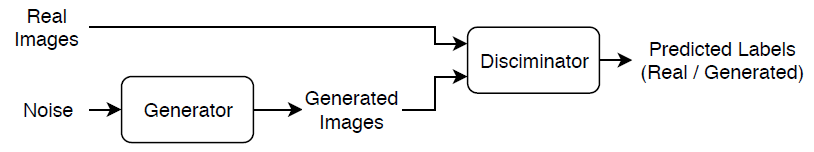

**The U-Net generator for GAN** (Generative Adversarial Networks) is a variation of the U-Net architecture that is used in the context of image-to-image translation tasks. In contrast to the traditional U-Net generator used for image segmentation, the U-Net generator for GAN is designed to produce a realistic output image that is similar to a target image, given a source image as input.

The U-Net generator for GAN architecture consists of an encoder-decoder structure similar to the traditional U-Net, but with some modifications.

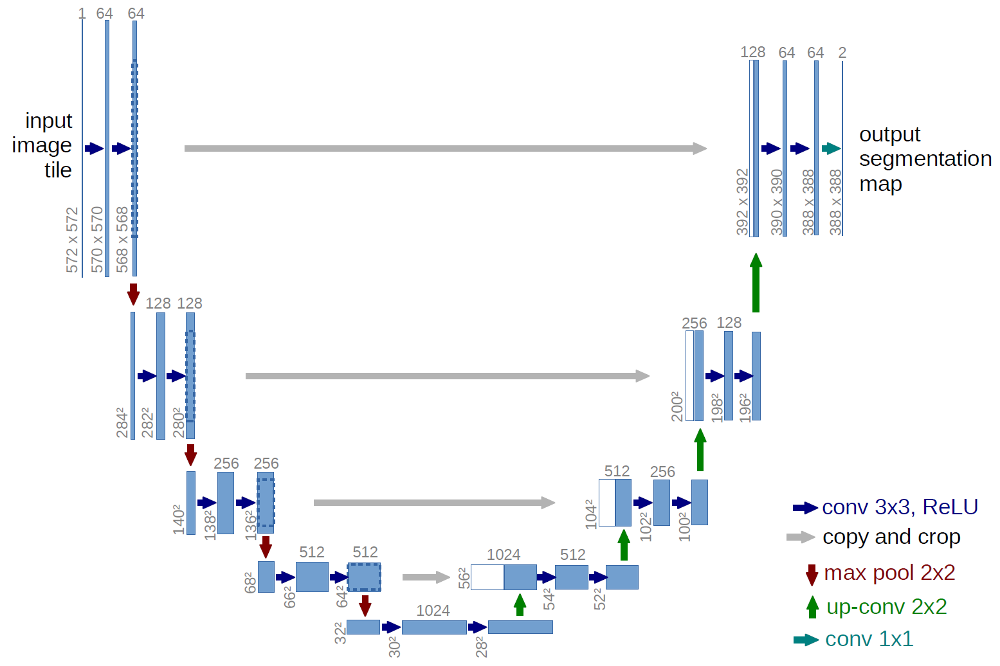

## Overview of the U-Net generator for GAN architecture:



1. Encoder: The encoder consists of a series of convolutional layers followed by a downsampling operation, typically using stride-2 convolutions or max pooling. Each convolutional layer learns to extract high-level features from the input image, while the downsampling operation reduces the spatial dimensions of the feature map.

2. Decoder: The decoder is composed of a series of upsampling layers followed by a convolutional layer. The upsampling layers increase the spatial dimensions of the feature map, while the convolutional layer reduces the number of channels and learns to generate the final output image.

3. Skip connections: As in the traditional U-Net architecture, the U-Net generator for GAN also uses skip connections between the encoder and decoder. However, in this case, the skip connections concatenate the feature maps from the encoder with the feature maps from the corresponding decoder layer. This allows the decoder to use information from earlier layers in the network to produce better translation results.

4. Output activation function: The final layer of the U-Net generator typically uses a tanh activation function, which produces a pixel-wise value between -1 and 1 indicating the intensity of each pixel in the output image.

Overall, the U-Net generator for GAN has been highly effective for a wide range of image-to-image translation tasks, including image colorization, style transfer, and more. It has become a popular choice in the deep learning community due to its high accuracy, efficiency, and flexibility.

In [ ]:
class ResUNetBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super().__init__()
        self.layer = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=3, padding=1, stride=stride, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels,kernel_size=3,padding=1, stride=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

        self.identity_map = nn.Conv2d(in_channels, out_channels,kernel_size=1,stride=stride)
        self.relu = nn.ReLU(inplace=True)
    def forward(self, inputs):
        x = inputs.clone().detach()
        out = self.layer(x)
        residual  = self.identity_map(inputs)
        skip = out + residual
        return self.relu(skip)

class DownSampleConv(nn.Module):
    def __init__(self, in_channels, out_channels, stride=1):
        super().__init__()
        self.layer = nn.Sequential(
            nn.MaxPool2d(2),
            ResUNetBlock(in_channels, out_channels)
        )

    def forward(self, inputs):
        return self.layer(inputs)


class UpSampleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.upsample = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.res_block = ResUNetBlock(in_channels + out_channels, out_channels)

    def forward(self, inputs, skip):
        x = self.upsample(inputs)
        x = torch.cat([x, skip], dim=1)
        x = self.res_block(x)
        return x

In [ ]:
class Generator(nn.Module):
    def __init__(self, input_channel, output_channel, dropout_rate = 0.2):
        super().__init__()
        self.encoding_layer1_ = ResUNetBlock(input_channel,64)
        self.encoding_layer2_ = DownSampleConv(64, 128)
        self.encoding_layer3_ = DownSampleConv(128, 256)
        self.bridge = DownSampleConv(256, 512)
        self.decoding_layer3_ = UpSampleConv(512, 256)
        self.decoding_layer2_ = UpSampleConv(256, 128)
        self.decoding_layer1_ = UpSampleConv(128, 64)
        self.output = nn.Conv2d(64, output_channel, kernel_size=1)
        self.dropout = nn.Dropout2d(dropout_rate)

    def forward(self, inputs):
        ###################### Enocoder #########################
        e1 = self.encoding_layer1_(inputs)
        e1 = self.dropout(e1)
        e2 = self.encoding_layer2_(e1)
        e2 = self.dropout(e2)
        e3 = self.encoding_layer3_(e2)
        e3 = self.dropout(e3)

        ###################### Bridge #########################
        bridge = self.bridge(e3)
        bridge = self.dropout(bridge)

        ###################### Decoder #########################
        d3 = self.decoding_layer3_(bridge, e3)
        d2 = self.decoding_layer2_(d3, e2)
        d1 = self.decoding_layer1_(d2, e1)

        ###################### Output #########################
        output = self.output(d1)
        return output

In [ ]:
model = Generator(1,2).to(device)
summary(model, (1, 128, 128), batch_size = 1)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [1, 64, 128, 128]             576
       BatchNorm2d-2          [1, 64, 128, 128]             128
              ReLU-3          [1, 64, 128, 128]               0
            Conv2d-4          [1, 64, 128, 128]          36,864
       BatchNorm2d-5          [1, 64, 128, 128]             128
              ReLU-6          [1, 64, 128, 128]               0
            Conv2d-7          [1, 64, 128, 128]             128
              ReLU-8          [1, 64, 128, 128]               0
      ResUNetBlock-9          [1, 64, 128, 128]               0
        Dropout2d-10          [1, 64, 128, 128]               0
        MaxPool2d-11            [1, 64, 64, 64]               0
           Conv2d-12           [1, 128, 64, 64]          73,728
      BatchNorm2d-13           [1, 128, 64, 64]             256
             ReLU-14           [1, 128,

##Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()

        def discriminator_block(in_filters, out_filters, normalization=True):
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalization:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(in_channels, 64, normalization=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.AdaptiveAvgPool2d(1),
            nn.Flatten(),
            nn.Linear(512, 1)
        )

    def forward(self, ab, l):
        # Concatenate image and condition image by channels to produce input
        img_input = torch.cat((ab, l), 1)
        output = self.model(img_input)
        return output

In [ ]:
disc1 = Discriminator(3).to(device)
summary(disc1, [(2, 128, 128), (1, 128, 128)], batch_size = 1)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [1, 64, 64, 64]           3,136
         LeakyReLU-2            [1, 64, 64, 64]               0
            Conv2d-3           [1, 128, 32, 32]         131,200
    InstanceNorm2d-4           [1, 128, 32, 32]               0
         LeakyReLU-5           [1, 128, 32, 32]               0
            Conv2d-6           [1, 256, 16, 16]         524,544
    InstanceNorm2d-7           [1, 256, 16, 16]               0
         LeakyReLU-8           [1, 256, 16, 16]               0
            Conv2d-9             [1, 512, 8, 8]       2,097,664
   InstanceNorm2d-10             [1, 512, 8, 8]               0
        LeakyReLU-11             [1, 512, 8, 8]               0
AdaptiveAvgPool2d-12             [1, 512, 1, 1]               0
          Flatten-13                   [1, 512]               0
           Linear-14                   

## Main model

Auxilary Functions:

In [ ]:
def lab_to_rgb(L, ab):
    """
    Takes an image or a batch of images and converts from LAB space to RGB
    """

    L = (L + 1.) * 50.
    ab = ab * 128.

    lab_img = torch.cat((L, ab), dim=2)
    lab_img = lab_img.permute(2, 0, 1)  # move channel dimension to front
    lab_img = lab_img.unsqueeze(0)  # add batch dimension

    # Convert back to RGB color space
    lab_img = lab_img.permute(0, 2, 3, 1)  # rearrange dimensions
    rgb_img = np.clip(np.squeeze(lab2rgb(lab_img.numpy())), 0, 1)
    rgb_img = (rgb_img * 255).astype('uint8')
    return rgb_img


def _weights_init(m):
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)



def display_progress(cond, real, fake, current_epoch = 0, figsize=(8,6)):
    """
    Save cond, real (original) and generated (fake)
    images in one panel
    """
    cond = cond.detach().cpu().permute(1, 2, 0)
    real = real.detach().cpu().permute(1, 2, 0)
    fake = fake.detach().cpu().permute(1, 2, 0)

    images = [cond, real, fake]
    titles = ['input','real','generated']
    print(f'Epoch: {current_epoch}')
    fig, ax = plt.subplots(1, 3, figsize=figsize)
    for idx,img in enumerate(images):
        if idx == 0:
            ab = torch.zeros((224,224,2))
            # img = torch.cat([images[0] * 100, ab], dim=2).numpy()
            # img = torch.cat([(mages[0], ab], dim=2).numpy()
            img = torch.cat([(images[0]+1.)*50., ab], dim=2).numpy()
            imgan = lab2rgb(img)
        else:
            # imgan = lab_to_rgb(images[0].reshape((1,224,224)).permute(1,2,0).reshape((224,224,1)),img.reshape((2,224,224)).permute(1,2,0).reshape((224,224,2)))
            imgan = lab_to_rgb(images[0],img)
        ax[idx].imshow(imgan)
        ax[idx].axis("off")
    for idx, title in enumerate(titles):
        ax[idx].set_title('{}'.format(title))
    plt.show()


def write_losses(file_name, loss_list):
    with open(file_name + '.txt','w') as file:
        for item in loss_list:
            file.write(str(item) + '\n')


def read_losses(file_name):
    loss_list = []
    with open(file_name + '.txt','r') as file:
        f = file.readlines()
        for item in f:
            loss_list.append(float(item))
    return loss_list

In [ ]:
class GAN(pl.LightningModule):

    def __init__(self, in_channels, out_channels, learning_rate=0.0002, lambda_recon=100, display_step=10):

        super().__init__()
        self.save_hyperparameters()

        self.display_step = display_step

        self.generator = Generator(in_channels, out_channels)
        self.discriminator = Discriminator(in_channels + out_channels)
        self.optimizer_G = optim.Adam(self.generator.parameters(), lr=learning_rate, betas=(0.5, 0.9))
        self.optimizer_D = optim.Adam(self.discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.9))
        self.lambda_recon = lambda_recon
        self.recon_criterion = nn.L1Loss()
        self.generator_losses, self.discriminator_losses  =[],[]
        self.automatic_optimization = False

    def configure_optimizers(self):
        return [self.optimizer_D, self.optimizer_G], []

    def generator_step(self, real_images, conditioned_images):
        self.optimizer_G.zero_grad()
        fake_images = self.generator(conditioned_images)
        adversarial_loss = self.discriminator(fake_images, conditioned_images).mean()
        recon_loss = self.recon_criterion(fake_images, real_images)
        loss_G = adversarial_loss + self.lambda_recon * recon_loss
        # loss_G.backward()
        self.manual_backward(loss_G)
        self.optimizer_G.step()

        # Keep track of the average generator loss
        self.generator_losses += [loss_G.item()]


    def discriminator_step(self, real_images, conditioned_images):
        self.optimizer_D.zero_grad()
        fake_images = self.generator(conditioned_images).detach()
        real_logits = self.discriminator(real_images, conditioned_images)
        fake_logits = self.discriminator(fake_images, conditioned_images)

        # Compute the loss for the discriminator
        loss_D = -(torch.mean(real_logits) - torch.mean(fake_logits))

        # Backpropagation
        self.manual_backward(loss_D)
        # loss_D.backward()
        self.optimizer_D.step()
        self.discriminator_losses += [loss_D.item()]

    def training_step(self, batch, batch_idx):
        real, condition = batch
        # train discriminator two times before train generator one time for more stable learning
        for _ in range(2):
            self.discriminator_step(real, condition)
        self.generator_step(real, condition)
        gen_mean = sum(self.generator_losses[-self.display_step:]) / self.display_step
        crit_mean = sum(self.discriminator_losses[-self.display_step:]) / self.display_step
        if self.current_epoch % self.display_step == 0 and batch_idx == 0:
            fake = self.generator(condition).detach()
            torch.save(self.generator.state_dict(), "gan_generator_" + str(self.current_epoch) + ".pt")
            torch.save(self.discriminator.state_dict(), "gan_discriminator_" + str(self.current_epoch) + ".pt")
            print(f"Epoch {self.current_epoch}: Generator loss: {gen_mean}, Discriminator loss: {crit_mean}")
            display_progress(condition[0], real[0], fake[0], self.current_epoch)

In [ ]:
gc.collect()
gan = GAN(in_channels = 1, out_channels = 2 ,learning_rate=2e-4, lambda_recon=100, display_step=5)

Let's train the model, Here we go :

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params
--------------------------------------------------
0 | generator       | Generator     | 8.2 M 
1 | discriminator   | Discriminator | 2.8 M 
2 | recon_criterion | L1Loss        | 0     
--------------------------------------------------
11.0 M    Trainable params
0         Non-trainable params
11.0 M    Total params
43.893    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Epoch 0: Generator loss: 6.311687088012695, Discriminator loss: -0.010137242078781129
Epoch: 0


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 22325 pixels
  return func(*args, **kwargs)


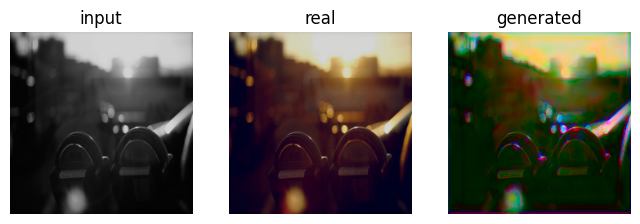

Epoch 5: Generator loss: 0.7447794914245606, Discriminator loss: -17.43641128540039
Epoch: 5


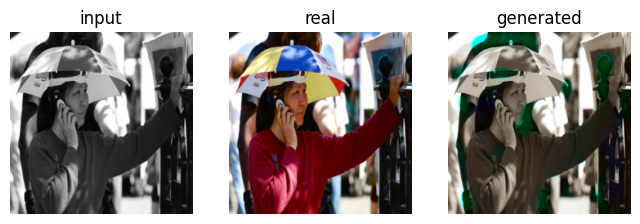

Epoch 10: Generator loss: -10.611479568481446, Discriminator loss: -38.38138656616211
Epoch: 10


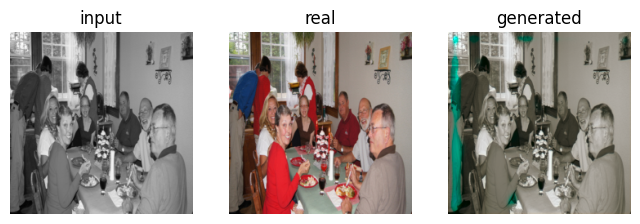

Epoch 15: Generator loss: -23.078532028198243, Discriminator loss: -61.323082733154294
Epoch: 15


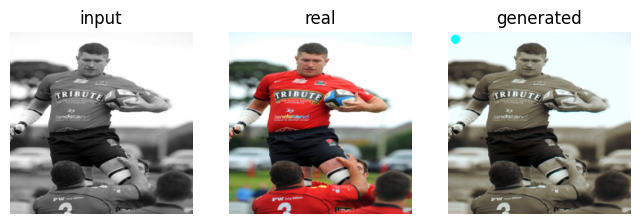

Epoch 20: Generator loss: -32.33709487915039, Discriminator loss: -84.11958465576171
Epoch: 20


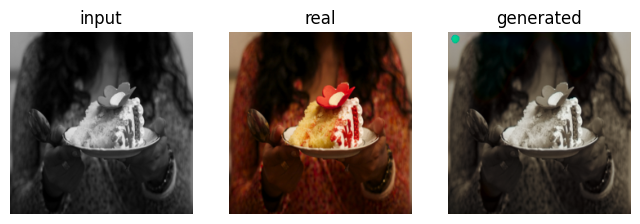

Epoch 25: Generator loss: -42.903455352783205, Discriminator loss: -104.19176635742187
Epoch: 25


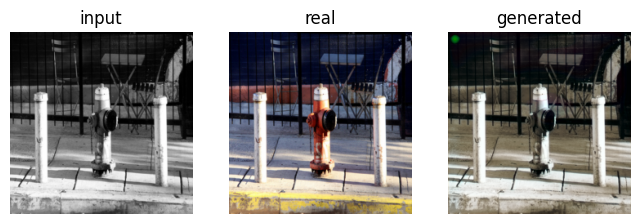

Epoch 30: Generator loss: -52.92025299072266, Discriminator loss: -125.45472259521485
Epoch: 30


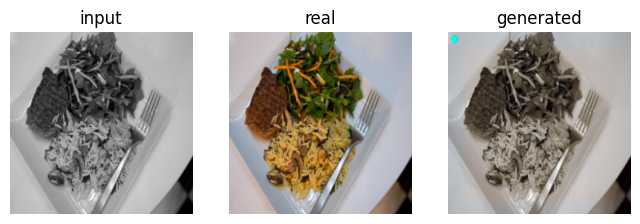

Epoch 35: Generator loss: -62.57107086181641, Discriminator loss: -148.68359375
Epoch: 35


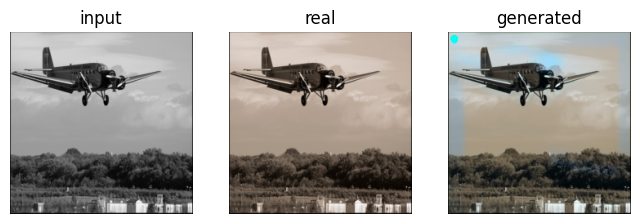

Epoch 40: Generator loss: -72.01614685058594, Discriminator loss: -166.02291870117188
Epoch: 40


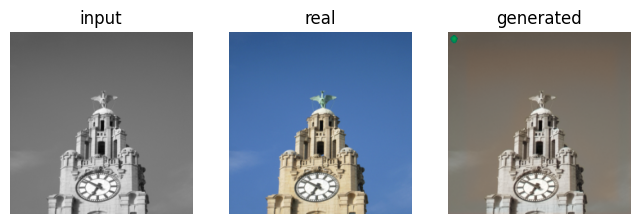

Epoch 45: Generator loss: -81.85751953125, Discriminator loss: -189.63941345214843
Epoch: 45


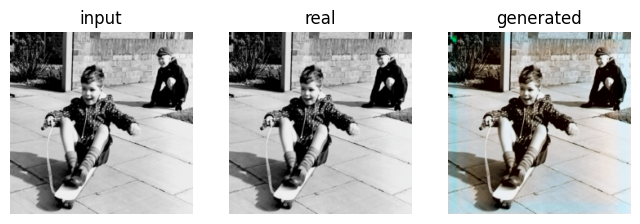

Epoch 50: Generator loss: -91.20419616699219, Discriminator loss: -213.61543884277344
Epoch: 50


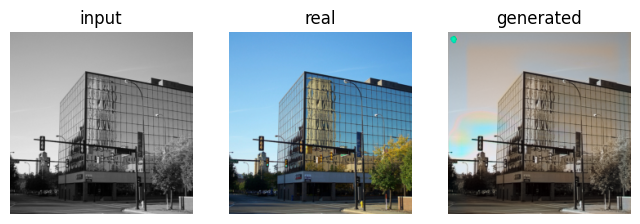

Epoch 55: Generator loss: -101.8931640625, Discriminator loss: -236.04217224121095
Epoch: 55


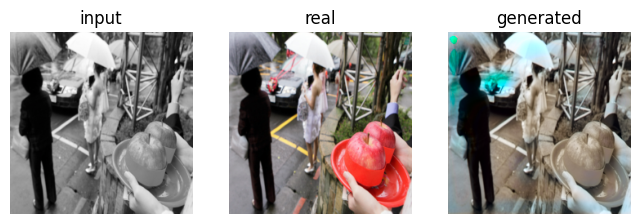

Epoch 60: Generator loss: -112.4486068725586, Discriminator loss: -256.89548950195314
Epoch: 60


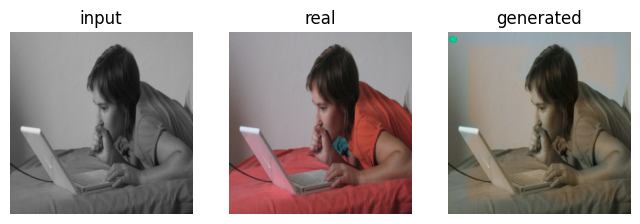

Epoch 65: Generator loss: -122.85177307128906, Discriminator loss: -281.41864624023435
Epoch: 65


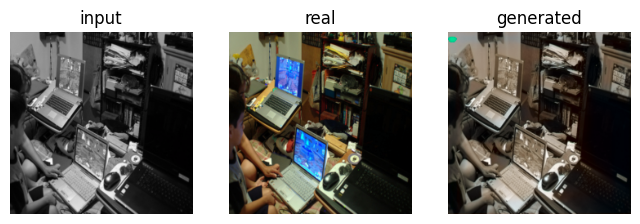

Epoch 70: Generator loss: -132.46455078125, Discriminator loss: -300.4791687011719
Epoch: 70


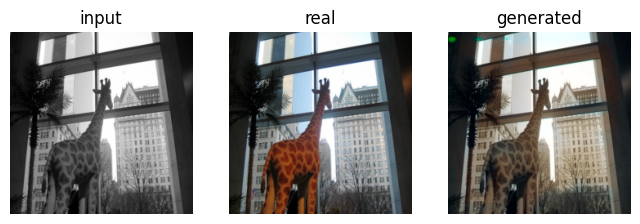

Epoch 75: Generator loss: -142.23805236816406, Discriminator loss: -324.3179504394531
Epoch: 75


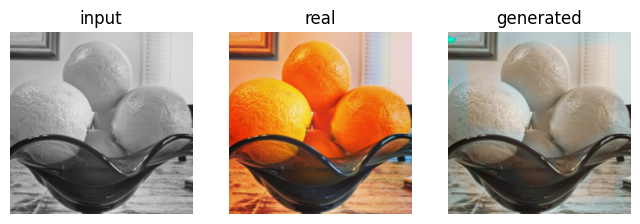

Epoch 80: Generator loss: -152.88341369628907, Discriminator loss: -342.4181884765625
Epoch: 80


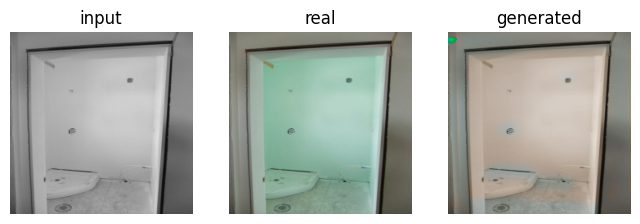

Epoch 85: Generator loss: -161.75184936523436, Discriminator loss: -366.7335998535156
Epoch: 85


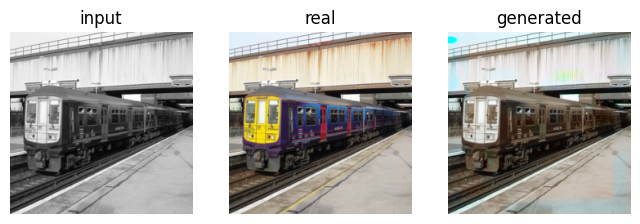

Epoch 90: Generator loss: -172.3025695800781, Discriminator loss: -391.4590209960937
Epoch: 90


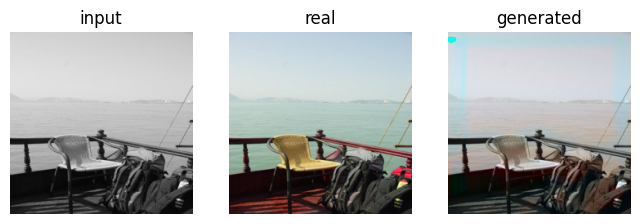

Epoch 95: Generator loss: -183.8656005859375, Discriminator loss: -416.5599426269531
Epoch: 95


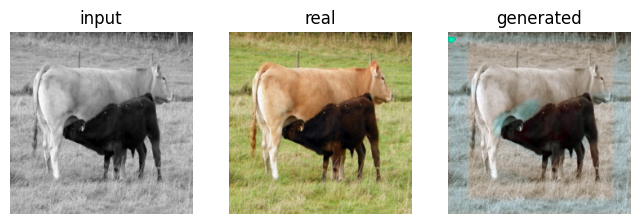

Epoch 100: Generator loss: -193.29210510253907, Discriminator loss: -439.5866760253906
Epoch: 100


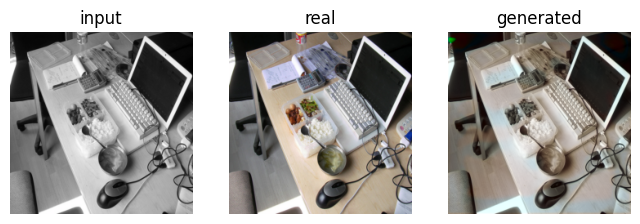

Epoch 105: Generator loss: -203.64049682617187, Discriminator loss: -459.11402587890626
Epoch: 105


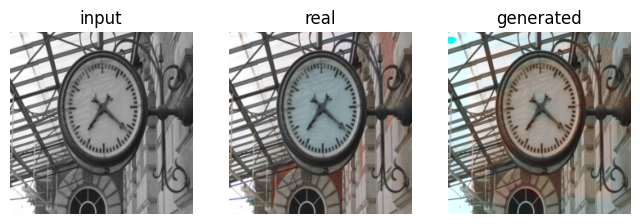

Epoch 110: Generator loss: -213.77193908691407, Discriminator loss: -484.1492065429687
Epoch: 110


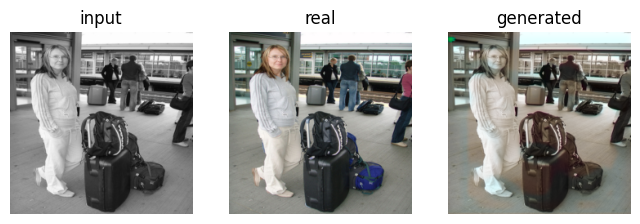

Epoch 115: Generator loss: -224.08712463378907, Discriminator loss: -499.228759765625
Epoch: 115


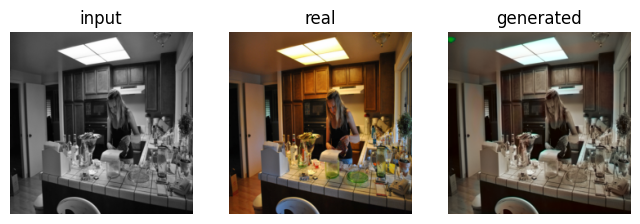

Epoch 120: Generator loss: -233.87834777832032, Discriminator loss: -521.084765625
Epoch: 120


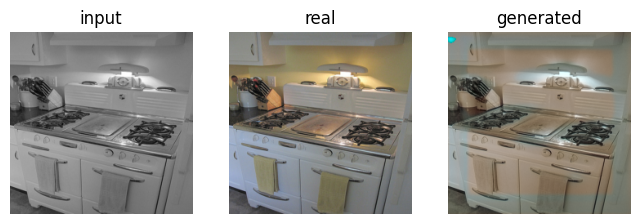

Epoch 125: Generator loss: -243.78271484375, Discriminator loss: -542.7138916015625
Epoch: 125


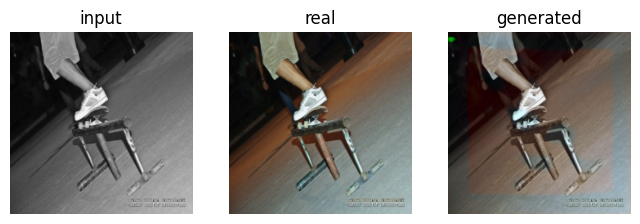

Epoch 130: Generator loss: -254.4813262939453, Discriminator loss: -564.1457641601562
Epoch: 130


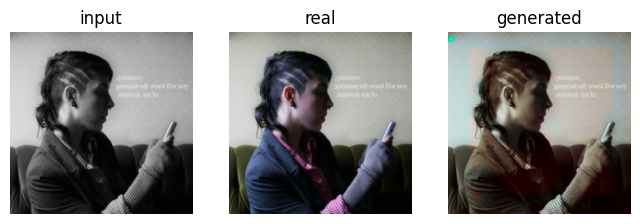

Epoch 135: Generator loss: -264.2443359375, Discriminator loss: -595.4821899414062
Epoch: 135


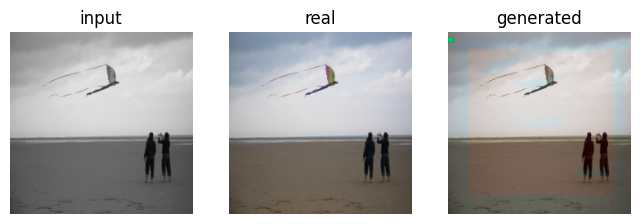

Epoch 140: Generator loss: -275.0074523925781, Discriminator loss: -616.6911987304687
Epoch: 140


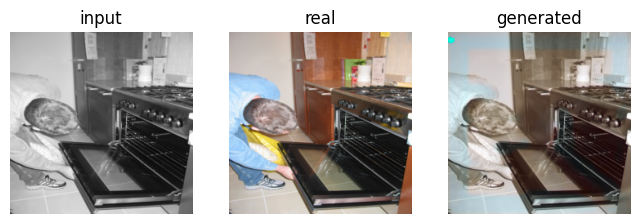

Epoch 145: Generator loss: -284.1177001953125, Discriminator loss: -633.65947265625
Epoch: 145


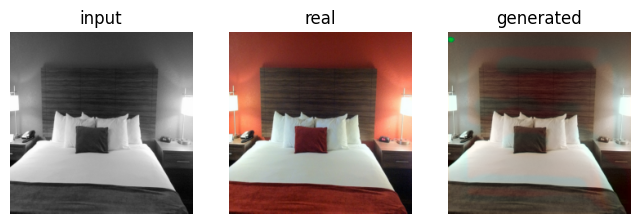

Epoch 150: Generator loss: -293.5566467285156, Discriminator loss: -654.9521484375
Epoch: 150


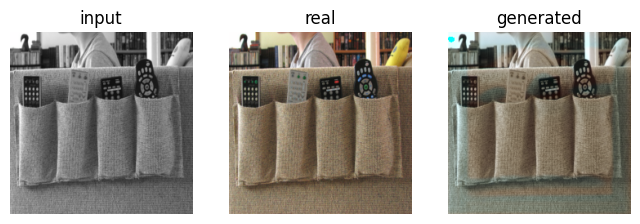

Epoch 155: Generator loss: -304.4979309082031, Discriminator loss: -683.7344848632813
Epoch: 155


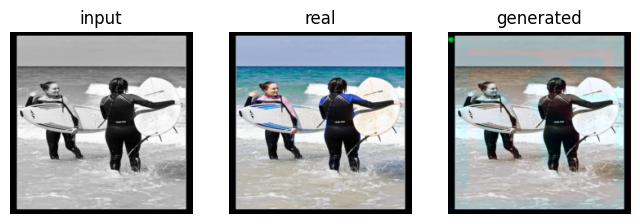

Epoch 160: Generator loss: -314.0101623535156, Discriminator loss: -705.8108276367187
Epoch: 160


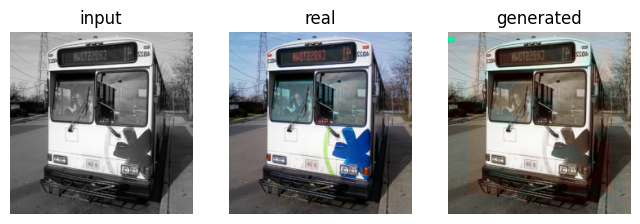

Epoch 165: Generator loss: -324.6421203613281, Discriminator loss: -707.5876708984375
Epoch: 165


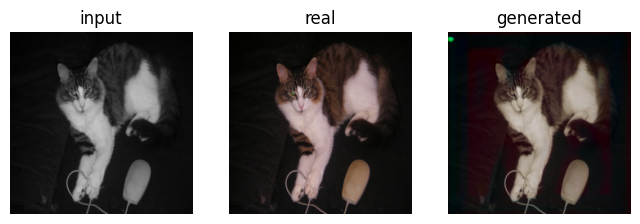

Epoch 170: Generator loss: -334.28936767578125, Discriminator loss: -742.5948608398437
Epoch: 170


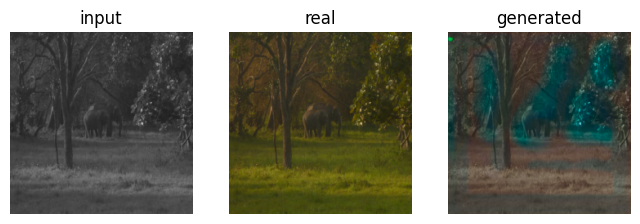

Epoch 175: Generator loss: -345.1696472167969, Discriminator loss: -774.3859497070313
Epoch: 175


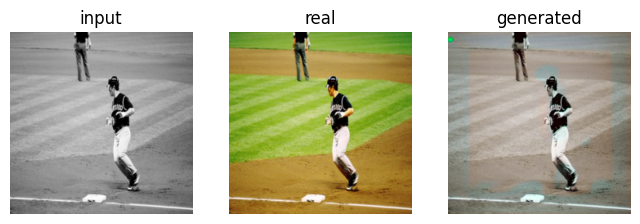

Epoch 180: Generator loss: -353.0096130371094, Discriminator loss: -792.32802734375
Epoch: 180


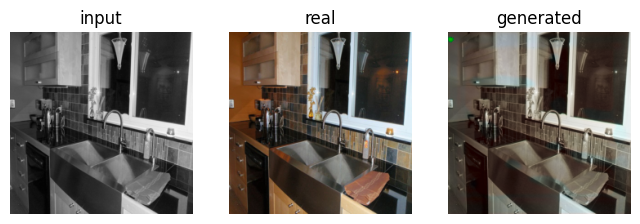

Epoch 185: Generator loss: -364.42650146484374, Discriminator loss: -812.4814453125
Epoch: 185


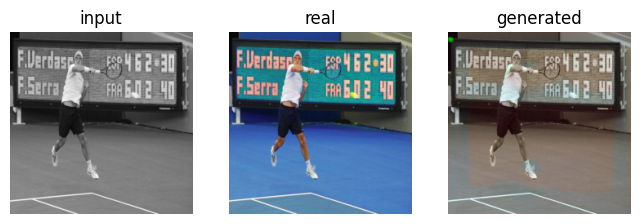

Epoch 190: Generator loss: -375.91944580078126, Discriminator loss: -841.6197387695313
Epoch: 190


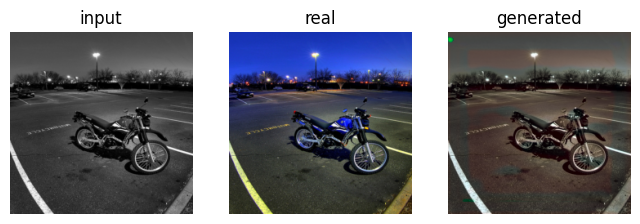

Epoch 195: Generator loss: -386.3161560058594, Discriminator loss: -855.4707275390625
Epoch: 195


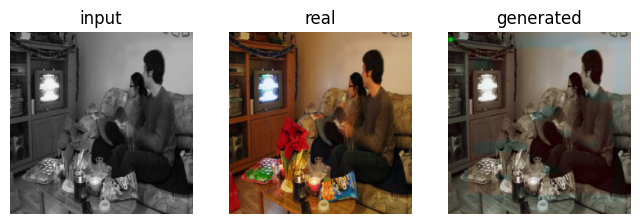

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.


In [ ]:
trainer = pl.Trainer(max_epochs=200)
trainer.fit(gan, train_loader)

In [ ]:
write_losses("GAN_generator_loss", self.generator_losses)
write_losses("GAN_discriminator_loss", self.discriminator_losses)

## Model test

The first test is to check whether the model works fine on one image. Of course we expect the model to overfit but here we want to check the ability of the model to overfit:

In [ ]:
# choose one random image
train_idx = np.random.permutation(5000)[0]
train_path = paths[train_idx]
train_data = ImageDataset(paths = [train_path], train=False)
train_loader = DataLoader(train_data, batch_size=1,shuffle=True,pin_memory = True)

gc.collect()
overfit_gan = GAN(in_channels = 1, out_channels = 2 ,learning_rate=2e-4, lambda_recon=100, display_step=100)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params
--------------------------------------------------
0 | generator       | Generator     | 8.2 M 
1 | discriminator   | Discriminator | 2.8 M 
2 | recon_criterion | L1Loss        | 0     
--------------------------------------------------
11.0 M    Trainable params
0         Non-trainable params
11.0 M    Total params
43.893    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Epoch 0: Generator loss: 0.30531553268432615, Discriminator loss: 1.706749200820923e-05
Epoch: 0


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 2904 pixels
  return func(*args, **kwargs)


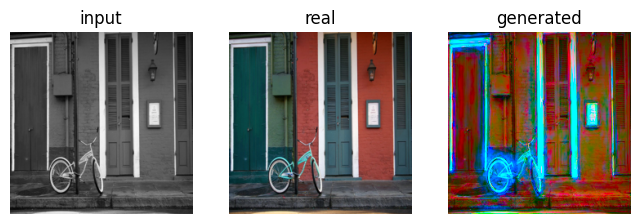

Epoch 100: Generator loss: 6.8595704531669615, Discriminator loss: -3.301794999241829
Epoch: 100


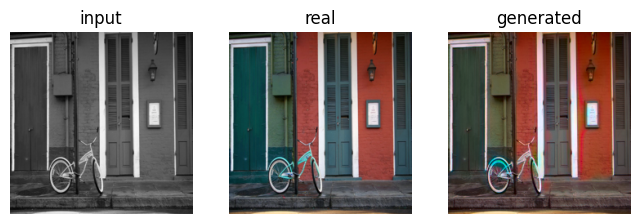

Epoch 200: Generator loss: -0.02320908546447754, Discriminator loss: -8.138958053588867
Epoch: 200


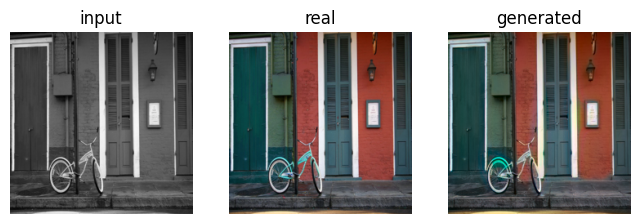

Epoch 300: Generator loss: -3.0925013780593873, Discriminator loss: -12.160098924636841
Epoch: 300


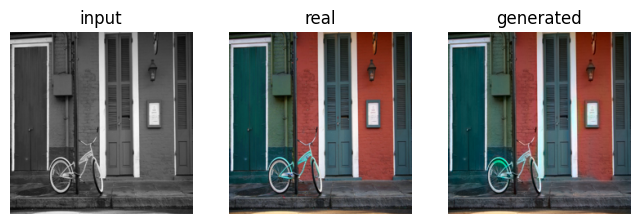

In [ ]:
trainer = pl.Trainer(max_epochs=1001)
trainer.fit(overfit_gan, train_loader)

In [ ]:
write_losses("overfit_generator_loss", overfit_gan.generator_losses)
write_losses("overfit_discriminator_loss", overfit_gan.discriminator_losses)


The result is acceptable. The model can learn how to colorize an image.

Let us see the loss function values:

Text(0, 0.5, 'Discriminator Loss')

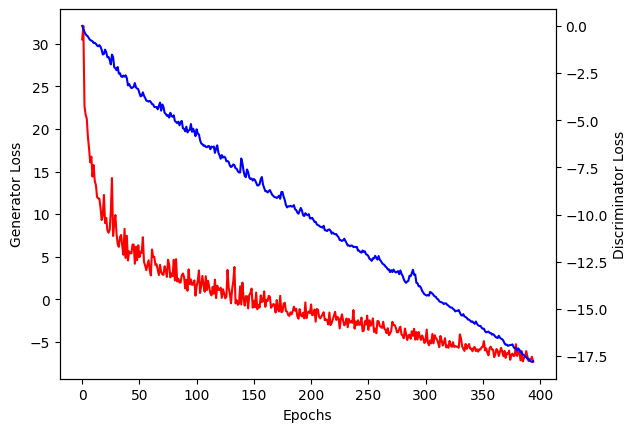

In [ ]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(gan.generator_losses, color='r')
ax2.plot(gan.discriminator_losses, color='b')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Generator Loss')
ax2.set_ylabel('Discriminator Loss')

In [ ]:
# Load previously created model
gan.generator.to(device).load_state_dict(torch.load("gan_generator_195.pt"))

<All keys matched successfully>

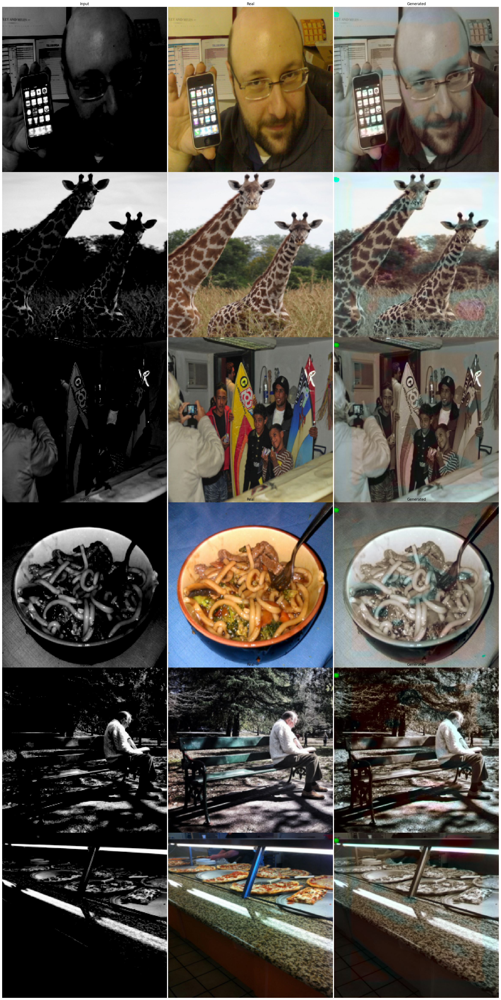

In [ ]:
plt.figure(figsize=(30,60))
idx =1
for batch_idx, batch in enumerate(test_loader):
    real, condition = batch
    condition = condition.to(device)
    pred = gan.generator(condition).detach().squeeze().permute(1, 2, 0).to('cpu')
    # pred = model(condition).detach().squeeze().permute(1, 2, 0).to('cpu')
    condition  = condition.detach().squeeze(0).permute(1, 2, 0).to('cpu')
    real  = real.detach().squeeze(0).permute(1, 2, 0)

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.subplot(6,3,idx)
    plt.grid(False)

    ab = torch.zeros((224,224,2))
    img = torch.cat([condition * 100, ab], dim=2).numpy()
    imgan = lab2rgb(img)
    plt.imshow(imgan)
    plt.title('Input')
    plt.axis("off")

    plt.subplot(6,3,idx + 1)

    ab = torch.zeros((224,224,2))
    imgan = lab_to_rgb(condition,real)
    plt.imshow(imgan)
    plt.title('Real')
    plt.axis("off")

    plt.subplot(6,3,idx + 2)
    imgan = lab_to_rgb(condition,pred)
    plt.title('Generated')
    plt.imshow(imgan)
    plt.axis("off")
    idx += 3
    if idx >= 18:
        break

# **CWGAN model**
improve GAN by CWGAN: CWGAN stands for Constrained Wassertein Generative Adversarial Network, which is a variant of the Wasserstein GAN (WGAN) that adds a constraint on the generator network to improve the quality of the generated samples.

Overall, CWGAN has been shown to improve the stability of GAN training and produce higher quality samples compared to traditional WGAN. It has been applied to a wide range of tasks, including image synthesis, text generation, and more.

In [ ]:
class CWGAN(pl.LightningModule):

    def __init__(self, in_channels, out_channels, learning_rate=0.0002, lambda_recon=100, display_step=10, lambda_gp=10, lambda_r1=10,):

        super().__init__()
        self.save_hyperparameters()

        self.display_step = display_step

        self.generator = Generator(in_channels, out_channels)
        self.discriminator = Discriminator(in_channels + out_channels)
        self.optimizer_G = optim.Adam(self.generator.parameters(), lr=learning_rate, betas=(0.5, 0.9))
        self.optimizer_D = optim.Adam(self.discriminator.parameters(), lr=learning_rate, betas=(0.5, 0.9))
        self.lambda_recon = lambda_recon
        self.lambda_gp = lambda_gp
        self.lambda_r1 = lambda_r1
        self.recon_criterion = nn.L1Loss()
        self.generator_losses, self.discriminator_losses  =[],[]
        self.automatic_optimization = False

    def configure_optimizers(self):
        return [self.optimizer_D, self.optimizer_G], []

    def generator_step(self, real_images, conditioned_images):
        # WGAN has only a reconstruction loss
        self.optimizer_G.zero_grad()
        fake_images = self.generator(conditioned_images)
        recon_loss = self.recon_criterion(fake_images, real_images)
        # recon_loss.backward()
        self.manual_backward(recon_loss)
        self.optimizer_G.step()

        # Keep track of the average generator loss
        self.generator_losses += [recon_loss.item()]


    def discriminator_step(self, real_images, conditioned_images):
        self.optimizer_D.zero_grad()
        fake_images = self.generator(conditioned_images)
        fake_logits = self.discriminator(fake_images, conditioned_images)
        real_logits = self.discriminator(real_images, conditioned_images)

        # Compute the loss for the discriminator
        loss_D = real_logits.mean() - fake_logits.mean()

        # Compute the gradient penalty
        alpha = torch.rand(real_images.size(0), 1, 1, 1, requires_grad=True)
        alpha = alpha.to(device)
        interpolated = (alpha * real_images + (1 - alpha) * fake_images.detach()).requires_grad_(True)

        interpolated_logits = self.discriminator(interpolated, conditioned_images)

        grad_outputs = torch.ones_like(interpolated_logits, dtype=torch.float32, requires_grad=True)
        gradients = torch.autograd.grad(outputs=interpolated_logits, inputs=interpolated, grad_outputs=grad_outputs,create_graph=True, retain_graph=True)[0]


        gradients = gradients.view(len(gradients), -1)
        gradients_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
        loss_D += self.lambda_gp * gradients_penalty

        # Compute the R1 regularization loss
        r1_reg = gradients.pow(2).sum(1).mean()
        loss_D += self.lambda_r1 * r1_reg

        # Backpropagation
        self.manual_backward(loss_D)
        # loss_D.backward()
        self.optimizer_D.step()
        self.discriminator_losses += [loss_D.item()]

    def training_step(self, batch, batch_idx):
        real, condition = batch
        # 2 discriminator training, 1 generator training
        for _ in range(2):
            self.discriminator_step(real, condition)
        self.generator_step(real, condition)
        gen_mean = sum(self.generator_losses[-self.display_step:]) / self.display_step
        crit_mean = sum(self.discriminator_losses[-self.display_step:]) / self.display_step
        if self.current_epoch%self.display_step==0 and batch_idx==0:
        # if self.current_epoch%self.display_step==0 and batch_idx==0 and optimizer_idx==1:
            fake = self.generator(condition).detach()
            torch.save(cwgan.generator.state_dict(), "cwgan_generator_"+ str(self.current_epoch) +".pt")

            torch.save(cwgan.discriminator.state_dict(), "cwgan_discriminator_"+ str(self.current_epoch) +".pt")
            print(f"Epoch {self.current_epoch} : Generator loss: {gen_mean}, Discriminator loss: {crit_mean}")
            display_progress(condition[0], real[0], fake[0], self.current_epoch)

In [ ]:
gc.collect()
cwgan = CWGAN(in_channels = 1, out_channels = 2 ,learning_rate=2e-4, lambda_recon=100, display_step=5)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type          | Params
--------------------------------------------------
0 | generator       | Generator     | 8.2 M 
1 | discriminator   | Discriminator | 2.8 M 
2 | recon_criterion | L1Loss        | 0     
--------------------------------------------------
11.0 M    Trainable params
0         Non-trainable params
11.0 M    Total params
43.893    Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

Epoch 0 : Generator loss: 0.06501510739326477, Discriminator loss: 3.3651758193969727
Epoch: 0


/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 562 pixels
  return func(*args, **kwargs)


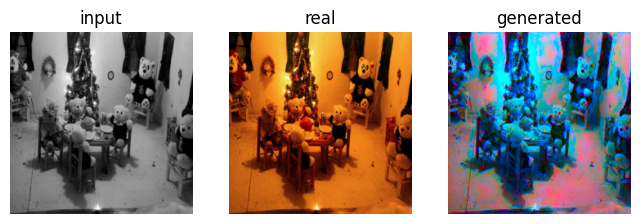

Epoch 5 : Generator loss: 0.08189494237303734, Discriminator loss: -3.2234756469726564
Epoch: 5


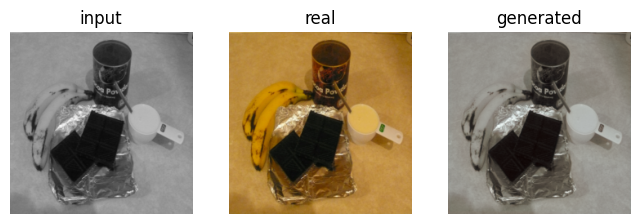

Epoch 10 : Generator loss: 0.07608817890286446, Discriminator loss: -6.913930606842041
Epoch: 10


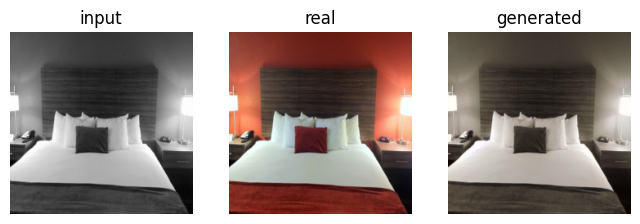

Epoch 15 : Generator loss: 0.0706096962094307, Discriminator loss: -11.631380653381347
Epoch: 15


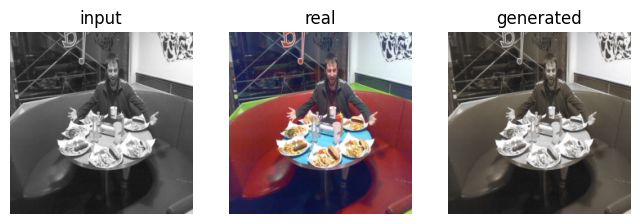

Epoch 20 : Generator loss: 0.0798493355512619, Discriminator loss: -12.832442283630371
Epoch: 20


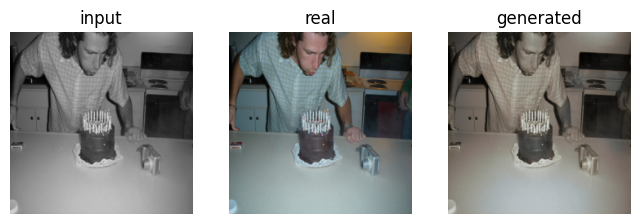

Epoch 25 : Generator loss: 0.08397721946239471, Discriminator loss: -18.54241485595703
Epoch: 25


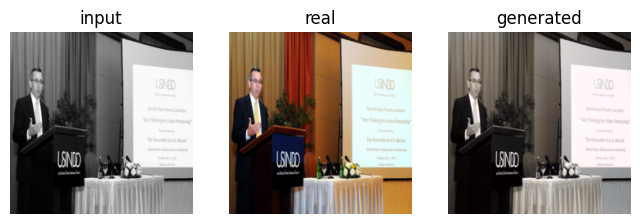

Epoch 30 : Generator loss: 0.07620335221290589, Discriminator loss: -17.255462074279784
Epoch: 30


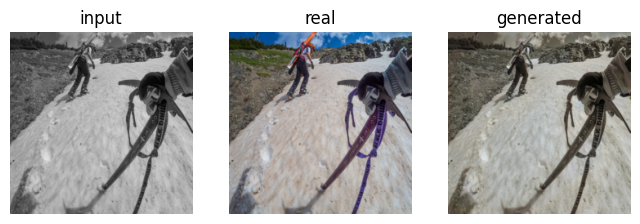

Epoch 35 : Generator loss: 0.07431086152791977, Discriminator loss: -15.387240600585937
Epoch: 35


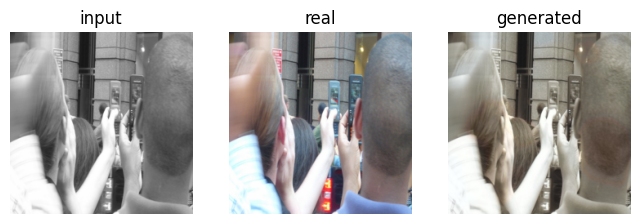

Epoch 40 : Generator loss: 0.07533772587776184, Discriminator loss: -16.723635292053224
Epoch: 40


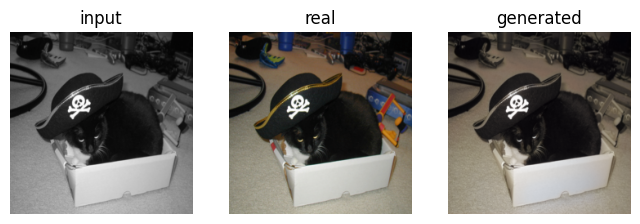

Epoch 45 : Generator loss: 0.0727621927857399, Discriminator loss: -15.893913078308106
Epoch: 45


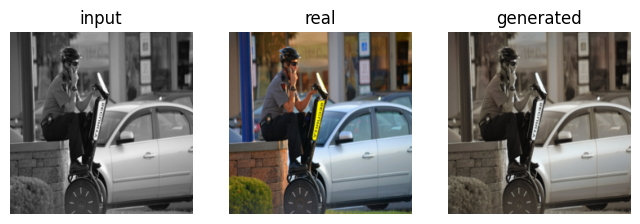

Epoch 50 : Generator loss: 0.07697579562664032, Discriminator loss: -14.865540313720704
Epoch: 50


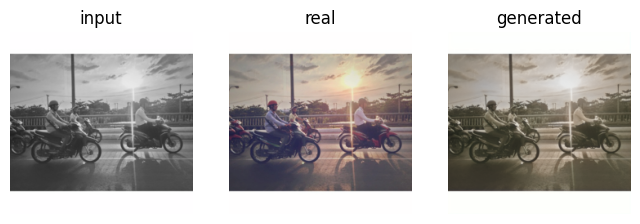

Epoch 55 : Generator loss: 0.07385730445384979, Discriminator loss: -19.61731834411621
Epoch: 55


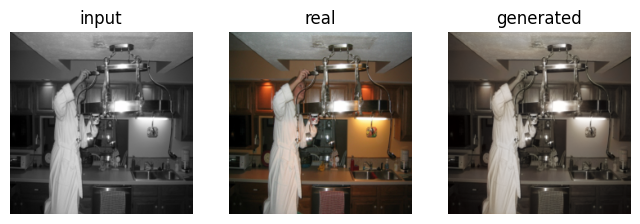

Epoch 60 : Generator loss: 0.08002517223358155, Discriminator loss: -18.1726375579834
Epoch: 60


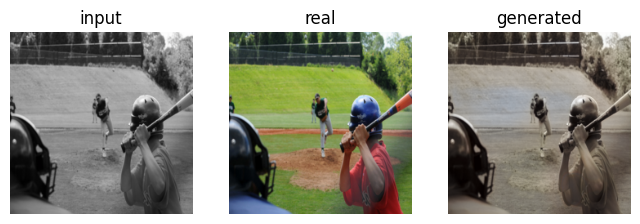

Epoch 65 : Generator loss: 0.07563977092504501, Discriminator loss: -18.85130920410156
Epoch: 65


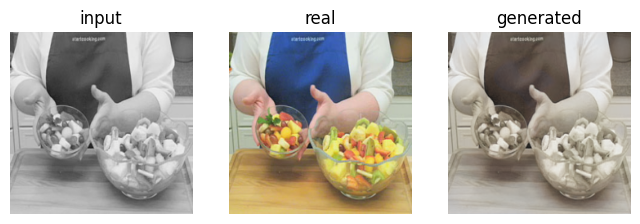

Epoch 70 : Generator loss: 0.08020691126585007, Discriminator loss: -23.032206344604493
Epoch: 70


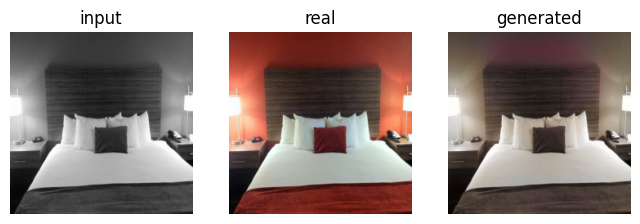

Epoch 75 : Generator loss: 0.07305505722761155, Discriminator loss: -15.081365394592286
Epoch: 75


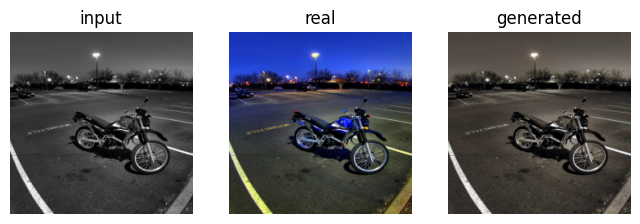

Epoch 80 : Generator loss: 0.07189196497201919, Discriminator loss: -20.853958511352538
Epoch: 80


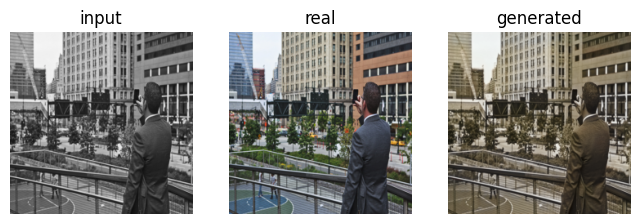

Epoch 85 : Generator loss: 0.0691127173602581, Discriminator loss: -17.532341384887694
Epoch: 85


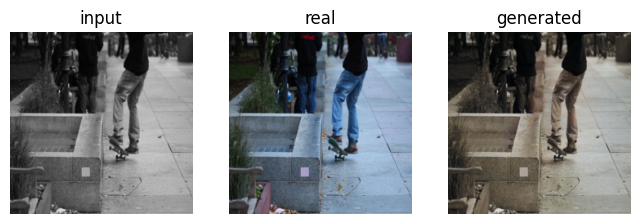

In [ ]:
trainer = pl.Trainer(max_epochs=200)
trainer.fit(cwgan, train_loader)

## Model test



In [ ]:
cwgan.generator.to(device).load_state_dict(torch.load("cwgan_generator_85.pt"))

<All keys matched successfully>

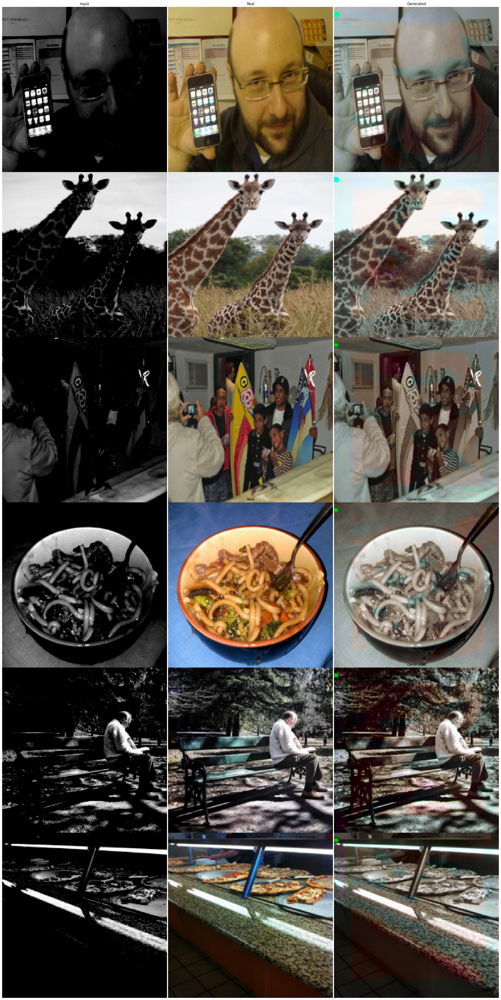

In [ ]:
plt.figure(figsize=(30,60))
# plt.figure(figsize=(20,30))
idx =1
for batch_idx, batch in enumerate(test_loader):
    real, condition = batch
    condition = condition.to(device)
    pred = cwgan.generator(condition).detach().squeeze().permute(1, 2, 0).to('cpu')
    # pred = model(condition).detach().squeeze().permute(1, 2, 0).to('cpu')
    condition  = condition.detach().squeeze(0).permute(1, 2, 0).to('cpu')
    real  = real.detach().squeeze(0).permute(1, 2, 0)

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.subplot(6,3,idx)
    plt.grid(False)

    ab = torch.zeros((224,224,2))
    img = torch.cat([condition * 100, ab], dim=2).numpy()
    imgan = lab2rgb(img)
    plt.imshow(imgan)
    plt.title('Input')
    plt.axis("off")

    plt.subplot(6,3,idx + 1)

    ab = torch.zeros((224,224,2))
    imgan = lab_to_rgb(condition,real)
    plt.imshow(imgan)
    plt.title('Real')
    plt.axis("off")

    plt.subplot(6,3,idx + 2)
    imgan = lab_to_rgb(condition,pred)
    plt.title('Generated')
    plt.imshow(imgan)
    plt.axis("off")
    idx += 3
    if idx >= 18:
        break

# Discussion

In this project, I built a GAN (generative adverserial network) for the task of image colorization and improved it with CWGAN. Here is a summarization of what that has been done in this notebook:

- As we can observe, the CWGAN model could do like GAN model in less trainig epochs. We conclude that the CWGAN could actually improve the GAN model as it should have.
- To check the sanity of the base model (GAN), I set the input to one image and let the model to train (overfit) to that image. We can see that I could actually do good and after about 300 epochs the model could train this single image.
- After 200 epochs of GAN training, the quality of generated images are still not good enough. This is because the GAN model is a big model and reqiures lots of traing time and space. Having the limitations of Colab, I could only do 200 epochs, but for acceptable results, the training should be on for around 2000 epochs.